In [3]:
import geopandas as gpd 
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from shapely.geometry import Point
import pandas as pd
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

In [4]:
bounds = gpd.read_file('data/ne_10m_admin_1_states_provinces/ne_10m_admin_1_states_provinces.shp')

<AxesSubplot: >

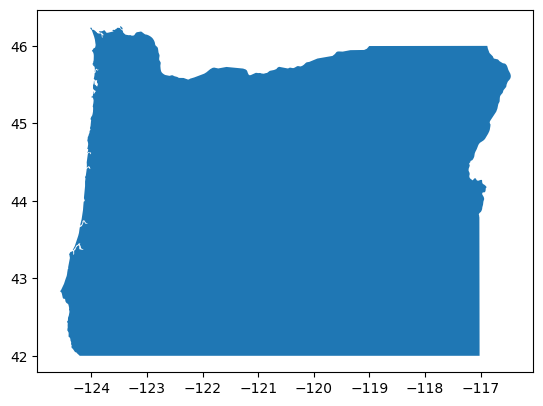

In [5]:
oregon = bounds[bounds['name'] == 'Oregon']
oregon.head()
oregon.plot()


In [6]:
oregon.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [7]:
fire_lookouts_points = gpd.read_file('data/fire_lookouts.csv')

In [8]:
fire_lookouts = gpd.GeoDataFrame(fire_lookouts_points, geometry=[Point(xy) for xy in zip(fire_lookouts_points['X'], fire_lookouts_points['Y'])])
fire_lookouts.crs = "EPSG:4326"

In [9]:
fire_lookouts

,X,Y,Name,description,geometry
0,-121.63547,44.39972,Black Butte,6436'<br>[http://www.firelookout.com/or/blackb...,POINT (-121.63547 44.39972)
1,-121.47505,45.2114,Bus Point,3333'<br>[http://www.firelookout.com/or/buspoi...,POINT (-121.47505 45.21140)
2,-121.71856,45.15647,Clear Lake Butte,4458'<br>[http://www.firelookout.com/or/clearl...,POINT (-121.71856 45.15647)
3,-121.87568,45.26415,Devils Peak,5045'<br>[http://www.firelookout.com/or/devils...,POINT (-121.87568 45.26415)
4,-121.23481,44.83982,Eagle Butte,3175'<br>[http://www.firelookout.com/or/eagleb...,POINT (-121.23481 44.83982)
...,...,...,...,...,...
178,-121.55381,44.62991,Alder Springs,4496'<br>[http://www.firelookout.com/or/alders...,POINT (-121.55381 44.62991)
179,-122.96456,42.90341,Callahan Mtn.,2914'<br>[http://www.firelookout.com/or/callah...,POINT (-122.96456 42.90341)
180,-122.31415,42.85178,Huckleberry (Shasta),6281'<br>[http://www.firelookout.com/or/huckle...,POINT (-122.31415 42.85178)
181,-121.29358,43.55536,Green Butte,5798'<br>[http://www.firelookout.com/or/greenb...,POINT (-121.29358 43.55536)


In [10]:
land_use_data = gpd.read_file('data/BLM_OR_Management_Ownership_Polygon_Hub_2393225992559009787/BLM_OR_Management_Ownership_Polygon_Hub.shp')

In [11]:
land_use_data.crs = "EPSG:4326"
oregon_bounds = (-124.5667, 42.0007, -116.4636, 46.2943)
land_use = land_use_data.cx[oregon_bounds[0]:oregon_bounds[2], oregon_bounds[1]:oregon_bounds[3]]

In [12]:
roads = gpd.read_file('data/oregon-latest-free.shp/gis_osm_roads_free_1.shp')

In [13]:
roads.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [14]:
roads

,osm_id,code,fclass,name,ref,oneway,maxspeed,layer,bridge,tunnel,geometry
0,4440143,5122,residential,Northeast Hodes Street,None,B,40,0,F,F,"LINESTRING (-122.89295 45.52973, -122.89274 45..."
1,4440967,5115,tertiary,Northeast Butler Street,None,B,56,0,F,F,"LINESTRING (-122.90531 45.53775, -122.90519 45..."
2,4441934,5131,motorway_link,None,None,F,0,0,F,F,"LINESTRING (-122.86746 45.54090, -122.86730 45..."
3,4443830,5122,residential,Northeast 85th Avenue,None,B,40,0,F,F,"LINESTRING (-122.89170 45.53231, -122.89171 45..."
4,4443836,5122,residential,Northeast Windstone Street,None,B,40,0,F,F,"LINESTRING (-122.88963 45.53199, -122.88975 45..."
...,...,...,...,...,...,...,...,...,...,...,...
719439,1288843508,5122,residential,Southwest 48th Avenue,None,B,32,0,F,F,"LINESTRING (-122.72702 45.48080, -122.72703 45..."
719440,1288843509,5122,residential,Southwest Pendleton Street,None,B,32,0,F,F,"LINESTRING (-122.72574 45.48120, -122.72609 45..."
719441,1288855493,5113,primary,Beltline Road,None,F,72,0,F,F,"LINESTRING (-123.04168 44.08406, -123.04156 44..."
719442,1288855494,5113,primary,Beltline Road,None,F,72,0,F,F,"LINESTRING (-123.04155 44.08425, -123.04170 44..."


In [15]:
roads.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 719444 entries, 0 to 719443
Data columns (total 11 columns):
 #   Column    Non-Null Count   Dtype   
---  ------    --------------   -----   
 0   osm_id    719444 non-null  object  
 1   code      719444 non-null  int64   
 2   fclass    719444 non-null  object  
 3   name      217907 non-null  object  
 4   ref       44008 non-null   object  
 5   oneway    719444 non-null  object  
 6   maxspeed  719444 non-null  int64   
 7   layer     719444 non-null  int64   
 8   bridge    719444 non-null  object  
 9   tunnel    719444 non-null  object  
 10  geometry  719444 non-null  geometry
dtypes: geometry(1), int64(3), object(7)
memory usage: 60.4+ MB


In [16]:
land_use = land_use.drop(columns=['OWNER_TYPE', 'JURIS_SOUR', 'SMA_ID', 'HOLD_ID', 'GLOBALID'])
land_use.head()

,PROPERTY_S,FEDERAL_ST,JURIS_NAME,geometry
0,STP,UND,None,"POLYGON ((-123.74825 45.90564, -123.74671 45.9..."
1,PVI,UND,Longview Fiber Co,"POLYGON ((-123.69010 45.90349, -123.68587 45.9..."
2,PVI,UND,None,"POLYGON ((-123.79378 45.89562, -123.77284 45.8..."
3,PVI,UND,None,"POLYGON ((-123.64831 45.89531, -123.64625 45.8..."
4,PVI,UND,Reynolds Metals,"POLYGON ((-122.82460 45.88417, -122.81432 45.8..."


JURIS_NAME
Private-Undefined           8.188407
Oregon Islands NWR          6.743599
Wallowa-Whitman NF          4.910252
Willamette NF               3.745798
Rogue River-Siskiyou NF     3.639938
VALE DISTRICT               3.089701
Deschutes NF                3.089701
MEDFORD DISTRICT            3.008271
Fremont-Winema NF           2.890779
LAKEVIEW DISTRICT           2.795389
Siuslaw National Forest     2.718611
Umatilla NF                 2.634855
FREMONT-WINEMA NF           2.282377
Umpqua NF                   2.211417
Malheur NF                  2.160232
Mt Hood NF                  2.074148
Yakama Reservation          1.754243
Gifford Pinchot N F         1.671649
PRINEVILLE DISTRICT         1.502972
ROSEBURG DISTRICT           1.465747
Warm Springs Reservation    1.436665
MALHEUR NF                  1.312192
DNR                         1.288927
Ochoco NF                   1.216803
BLM                         1.145842
BURNS DISTRICT              1.048125
Name: count, dtype: float64

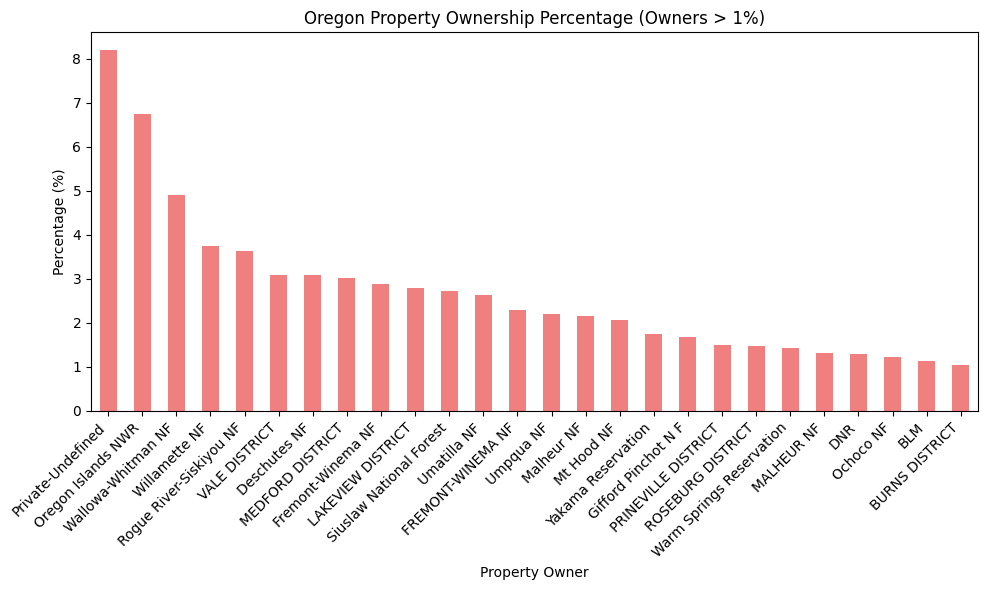

In [17]:
juris_counts = land_use['JURIS_NAME'].value_counts()
owner_percentages = (juris_counts / juris_counts.sum()) * 100

filtered_owner_percentages = owner_percentages[owner_percentages > 1]

print(filtered_owner_percentages)

plt.figure(figsize=(10, 6))
filtered_owner_percentages.plot(kind='bar', color='lightcoral')
plt.title('Oregon Property Ownership Percentage (Owners > 1%)')
plt.xlabel('Property Owner')
plt.ylabel('Percentage (%)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

plt.savefig('filtered_property_ownership_percentage.png', bbox_inches='tight')

plt.show()

In [18]:
property_counts = land_use['PROPERTY_S'].value_counts()
property_percentages = (property_counts / property_counts.sum()) * 100
print(property_percentages)

PROPERTY_S
PV       36.633844
BLM      21.207387
USFS     19.335527
PVI       4.659981
FWS       4.531693
ST        2.208830
BIA       2.168918
PVN       2.009271
LG        1.679144
WATER     1.589057
STF       1.262351
STP       0.605518
BR        0.565606
COE       0.416793
STW       0.334688
UND       0.310741
NPS       0.251444
DOD       0.070131
STL       0.053596
DOE       0.035921
PVU       0.020526
USDA      0.017105
GSA       0.015395
BPA       0.011403
USCG      0.002851
FAA       0.002281
Name: count, dtype: float64


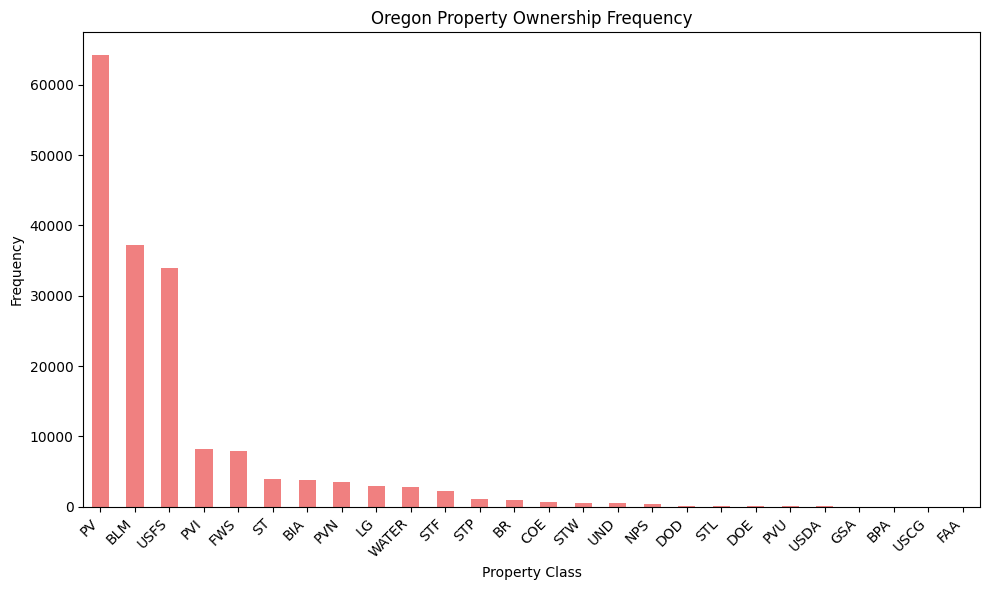

In [19]:
plt.figure(figsize=(10, 6))
property_counts.plot(kind='bar', color='lightcoral')
plt.title('Oregon Property Ownership Frequency')
plt.xlabel('Property Class')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('ps_hist.png', bbox_inches='tight')
plt.show()

In [20]:
fed_counts = land_use['FEDERAL_ST'].value_counts()
federal_percentages = (fed_counts / fed_counts.sum()) * 100
print(federal_percentages)

FEDERAL_ST
UND      55.685745
PD       32.439875
NA        3.993477
OC        3.954135
AQ        2.281824
IAF       0.758327
LU        0.347804
IAT       0.185306
LWCF      0.164779
CB        0.128859
MTP       0.050745
Trust     0.005132
ST        0.001140
+         0.001140
HST       0.001140
PVT       0.000570
Name: count, dtype: float64


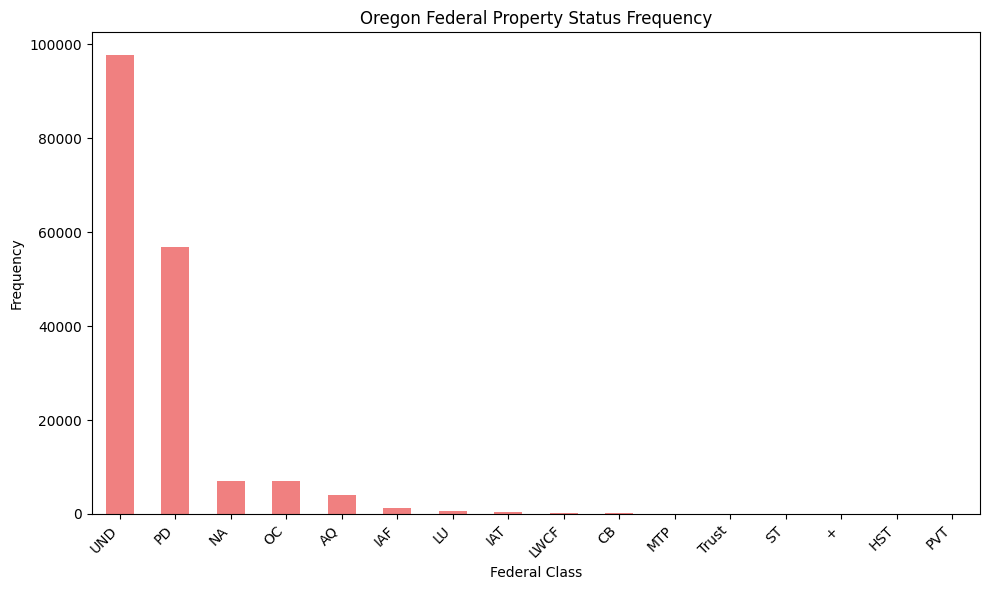

In [21]:
plt.figure(figsize=(10, 6))
fed_counts.plot(kind='bar', color='lightcoral')
plt.title('Oregon Federal Property Status Frequency')
plt.xlabel('Federal Class')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('fs_hist.png', bbox_inches='tight')
plt.show()

In [22]:
filtered_land_use = land_use[land_use['PROPERTY_S'].isin(['BLM', 'USFS', 'PV', 'PVI', 'PVN', 'PVU'])].copy()

private_features = ['PV', 'PVI', 'PVN', 'PVU']
filtered_land_use.loc[filtered_land_use['PROPERTY_S'].isin(private_features), 'PROPERTY_S'] = 'PRIVATE'

filtered_land_use = filtered_land_use[['PROPERTY_S', 'geometry']]
filtered_land_use

,PROPERTY_S,geometry
1,PRIVATE,"POLYGON ((-123.69010 45.90349, -123.68587 45.9..."
2,PRIVATE,"POLYGON ((-123.79378 45.89562, -123.77284 45.8..."
3,PRIVATE,"POLYGON ((-123.64831 45.89531, -123.64625 45.8..."
4,PRIVATE,"POLYGON ((-122.82460 45.88417, -122.81432 45.8..."
5,PRIVATE,"POLYGON ((-123.83542 45.87004, -123.81498 45.8..."
...,...,...
268590,PRIVATE,"POLYGON ((-123.49918 45.10463, -123.49945 45.1..."
268591,BLM,"POLYGON ((-123.52437 45.10855, -123.52437 45.1..."
268592,PRIVATE,"POLYGON ((-123.47562 45.08722, -123.47899 45.0..."
268593,PRIVATE,"POLYGON ((-123.49403 45.10435, -123.49945 45.1..."


In [23]:
tracks = roads[roads['fclass'].isin(['track', 'road', 'unclassified'])].reset_index(drop = True)
tracks = tracks.drop(columns = ['oneway', 'maxspeed', 'layer', 'bridge', 'tunnel'])
tracks.head()

,osm_id,code,fclass,name,ref,geometry
0,5039270,5142,track,None,None,"LINESTRING (-121.48697 45.56883, -121.48770 45..."
1,5039272,5142,track,Old Climb Out,None,"LINESTRING (-121.44938 45.65114, -121.44963 45..."
2,5039291,5142,track,None,None,"LINESTRING (-121.68976 45.57081, -121.69080 45..."
3,5039301,5142,track,None,None,"LINESTRING (-121.48040 45.57999, -121.48030 45..."
4,5039302,5142,track,None,NF 1600020,"LINESTRING (-121.72888 45.50966, -121.72881 45..."


In [24]:
"""
Helper Functions
"""

def print_key_value(attributes): 
    print('Value Definition:\n')
    for i, (key, value) in enumerate(attributes.items()):
        print(f"\t{key} : {value}\n")

def plot_custom_marker(ax, gdf, image_path, zoom = 0.03):
    img = plt.imread(image_path)
    img_height, img_width = img.shape[:2]
    offset_x = -img_width * zoom / 2
    offset_y = -img_height * zoom 
    for x, y in zip(gdf.geometry.x, gdf.geometry.y):
        im = OffsetImage(img, zoom=zoom)
        im.set_offset((offset_x, offset_y))
        ab = AnnotationBbox(im, (x, y), frameon=False)
        ax.add_artist(ab)

def find_features(features):
    features = []
    for feature in land_use['FEDERAL_ST']:
        if feature not in features:
            features.append(feature) 
    print(f"Feature list: {features}")
    return features

tower_marker_path = 'images/148275.png'

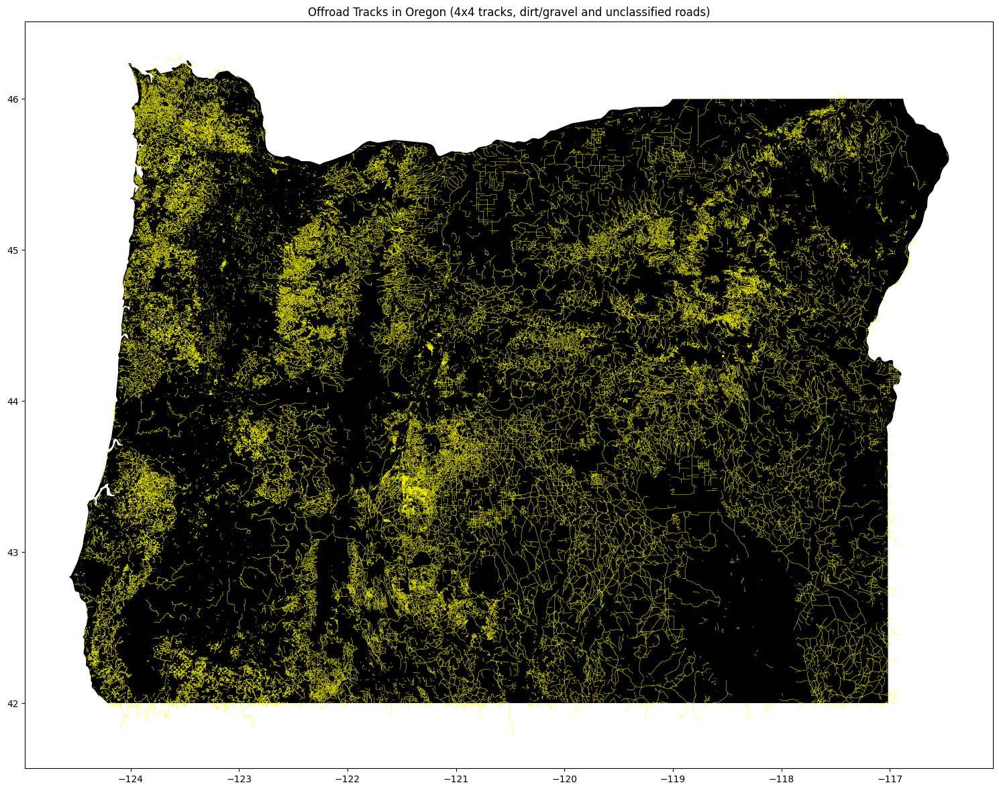

In [25]:
ax = oregon.plot(figsize=(15, 15), color = 'black')
tracks.plot(ax=ax, color='yellow', linewidth=0.35)
ax.set_title('Offroad Tracks in Oregon (4x4 tracks, dirt/gravel and unclassified roads)')
plt.tight_layout()
plt.savefig('all_tracks.png', bbox_inches='tight')
plt.show()

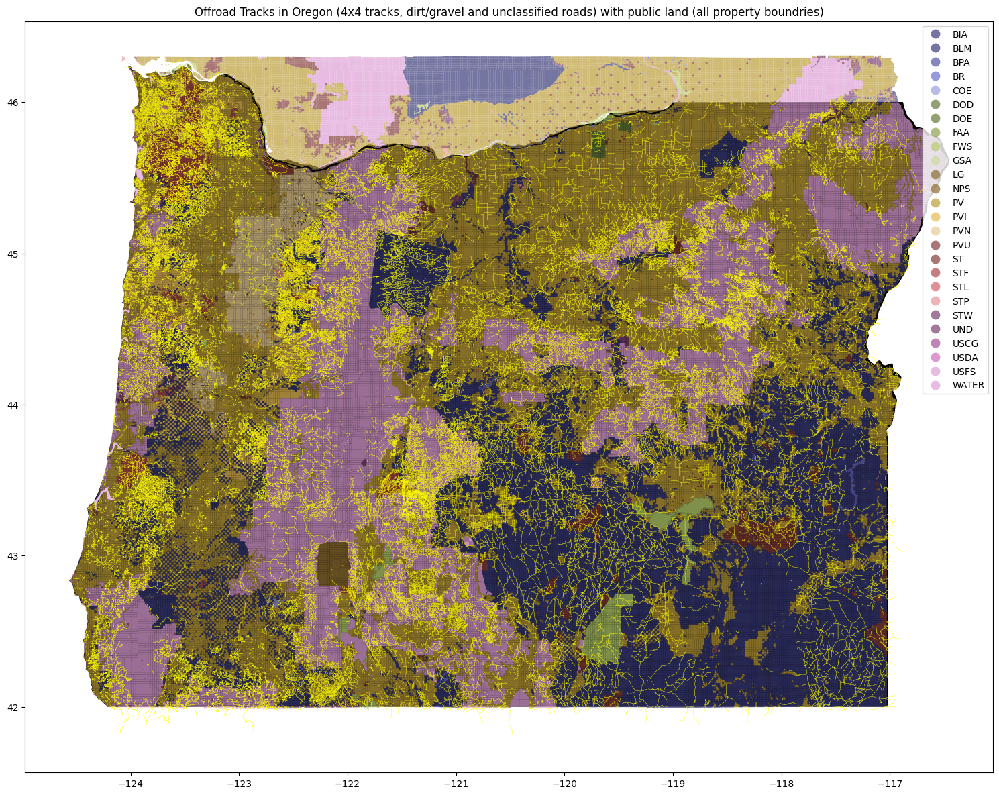

In [26]:
ax = oregon.plot(figsize=(15, 15), color = 'black')
tracks.plot(ax=ax, color='yellow', linewidth=0.35)
land_use.plot(ax=ax, column='PROPERTY_S', legend=True, linewidth = 0.3, cmap = 'tab20b', alpha = 0.7)
ax.set_title('Offroad Tracks in Oregon (4x4 tracks, dirt/gravel and unclassified roads) with public land (all property boundries)')
plt.tight_layout()
plt.savefig('all_property_boundries.png', bbox_inches='tight')
plt.show()

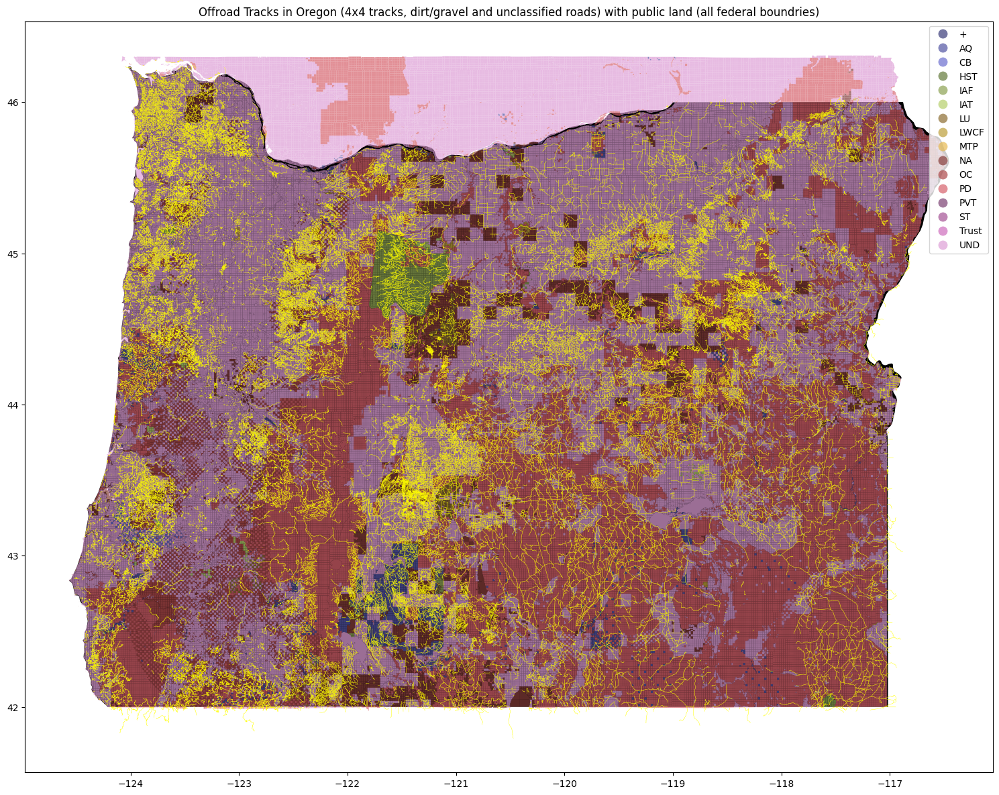

In [27]:
ax = oregon.plot(figsize=(15, 15), color = 'black')
tracks.plot(ax=ax, color='yellow', linewidth=0.35)
land_use.plot(ax=ax, column='FEDERAL_ST', legend=True, linewidth = 0.3, cmap = 'tab20b', alpha = 0.7)
ax.set_title('Offroad Tracks in Oregon (4x4 tracks, dirt/gravel and unclassified roads) with public land (all federal boundries)')
plt.tight_layout()
plt.savefig('all_federal_boundries.png', bbox_inches='tight')
plt.show()

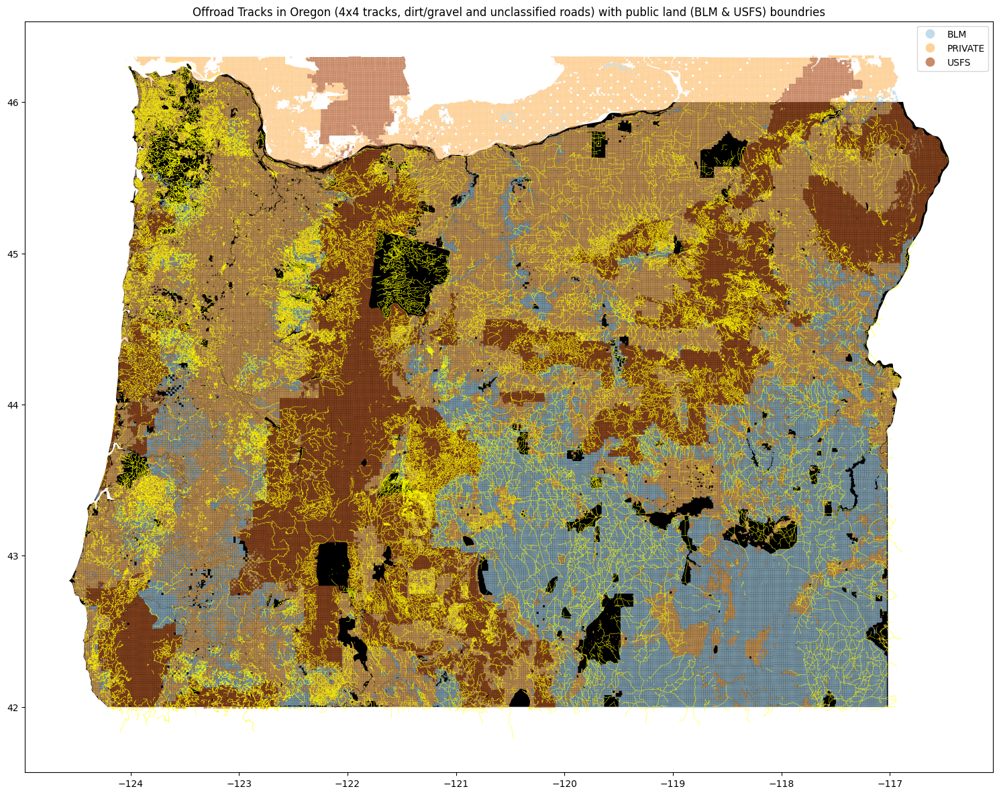

In [28]:
ax = oregon.plot(figsize=(15, 15), color = 'black')
tracks.plot(ax=ax, color='yellow', linewidth=0.35)
filtered_land_use.plot(ax=ax, column='PROPERTY_S', legend=True, linewidth = 0.3, cmap = 'Paired', alpha = 0.7)

ax.set_title('Offroad Tracks in Oregon (4x4 tracks, dirt/gravel and unclassified roads) with public land (BLM & USFS) boundries')
plt.tight_layout()
plt.savefig('blm_usfs_boundries.png', bbox_inches='tight')
plt.show()


In [29]:
joined_gdf = gpd.sjoin(tracks, land_use, how="left", predicate='intersects')

classified_tracks = joined_gdf[['osm_id', 'code', 'fclass', 'name', 'ref', 'geometry',
                                'PROPERTY_S', 'FEDERAL_ST', 'JURIS_NAME']]

In [30]:
classified_tracks.head()

,osm_id,code,fclass,name,ref,geometry,PROPERTY_S,FEDERAL_ST,JURIS_NAME
0,5039270,5142,track,None,None,"LINESTRING (-121.48697 45.56883, -121.48770 45...",PV,UND,None
1,5039272,5142,track,Old Climb Out,None,"LINESTRING (-121.44938 45.65114, -121.44963 45...",PV,NA,None
1,5039272,5142,track,Old Climb Out,None,"LINESTRING (-121.44938 45.65114, -121.44963 45...",PV,NA,None
2,5039291,5142,track,None,None,"LINESTRING (-121.68976 45.57081, -121.69080 45...",PV,UND,None
2,5039291,5142,track,None,None,"LINESTRING (-121.68976 45.57081, -121.69080 45...",PV,UND,None
...,...,...,...,...,...,...,...,...,...
94529,1288832111,5142,track,None,None,"LINESTRING (-123.96602 44.34321, -123.96623 44...",USFS,PD,Siuslaw National Forest
94530,1288832113,5142,track,United States Forest Service Road 3515-116,FR 3515-116,"LINESTRING (-123.72004 44.24338, -123.72020 44...",USFS,PD,Siuslaw National Forest
94531,1288832114,5142,track,United States Forest Service Road 3515-115,FR 3515-115,"LINESTRING (-123.71135 44.23150, -123.71192 44...",USFS,PD,Siuslaw National Forest
94531,1288832114,5142,track,United States Forest Service Road 3515-115,FR 3515-115,"LINESTRING (-123.71135 44.23150, -123.71192 44...",USFS,PD,Siuslaw National Forest


In [31]:
tracks_public = classified_tracks[classified_tracks['PROPERTY_S'].isin(['USFS', 'BLM'])].reset_index(drop = True)
tracks_public.head()

,osm_id,code,fclass,name,ref,geometry,PROPERTY_S,FEDERAL_ST,JURIS_NAME
0,5039302,5142,track,None,NF 1600020,"LINESTRING (-121.72888 45.50966, -121.72881 45...",USFS,PD,MT HOOD NF
1,5039365,5142,track,None,None,"LINESTRING (-121.53703 45.56481, -121.53687 45...",USFS,UND,Mt Hood NF
2,5039369,5142,track,None,None,"LINESTRING (-121.57164 45.33781, -121.57203 45...",USFS,UND,Mt Hood NF
3,5039378,5121,unclassified,Hood River Road,None,"LINESTRING (-121.62637 45.32024, -121.62634 45...",USFS,UND,Mt Hood NF
4,5039382,5142,track,Sawtooth Mountain Road,NF 1350,"LINESTRING (-121.77926 45.51383, -121.77942 45...",USFS,PD,Mt Hood NF


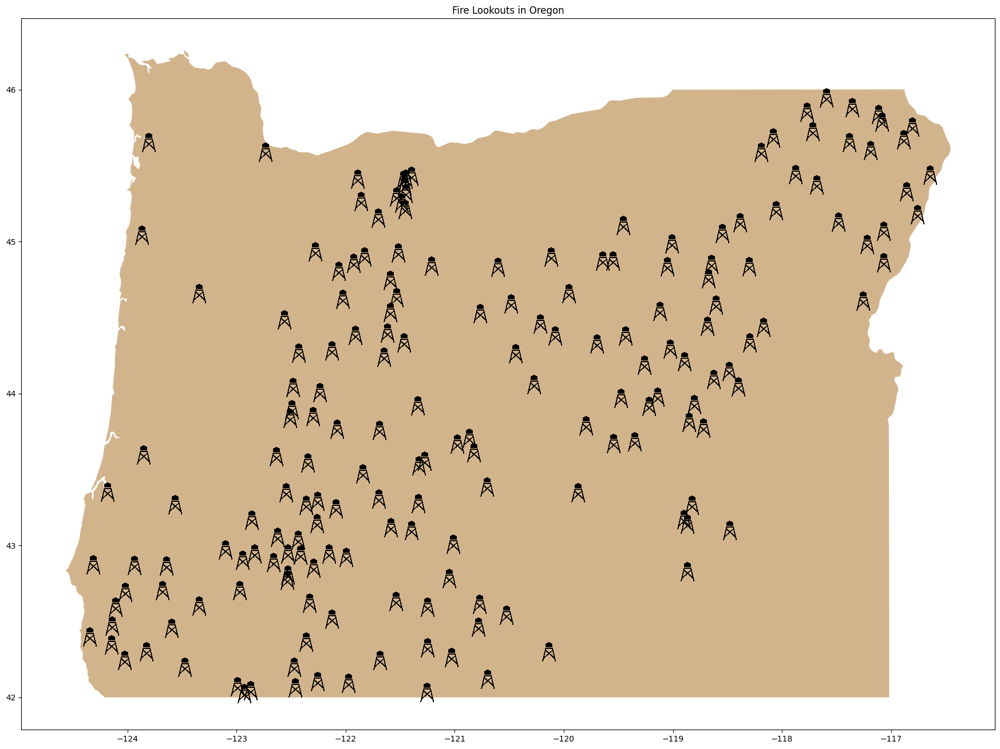

In [32]:
ax = oregon.plot(figsize=(20, 20), color='tan')
plot_custom_marker(ax, fire_lookouts, tower_marker_path)
ax.set_title('Fire Lookouts in Oregon')
plt.tight_layout()
plt.savefig('lookouts.png', bbox_inches='tight')
plt.show()

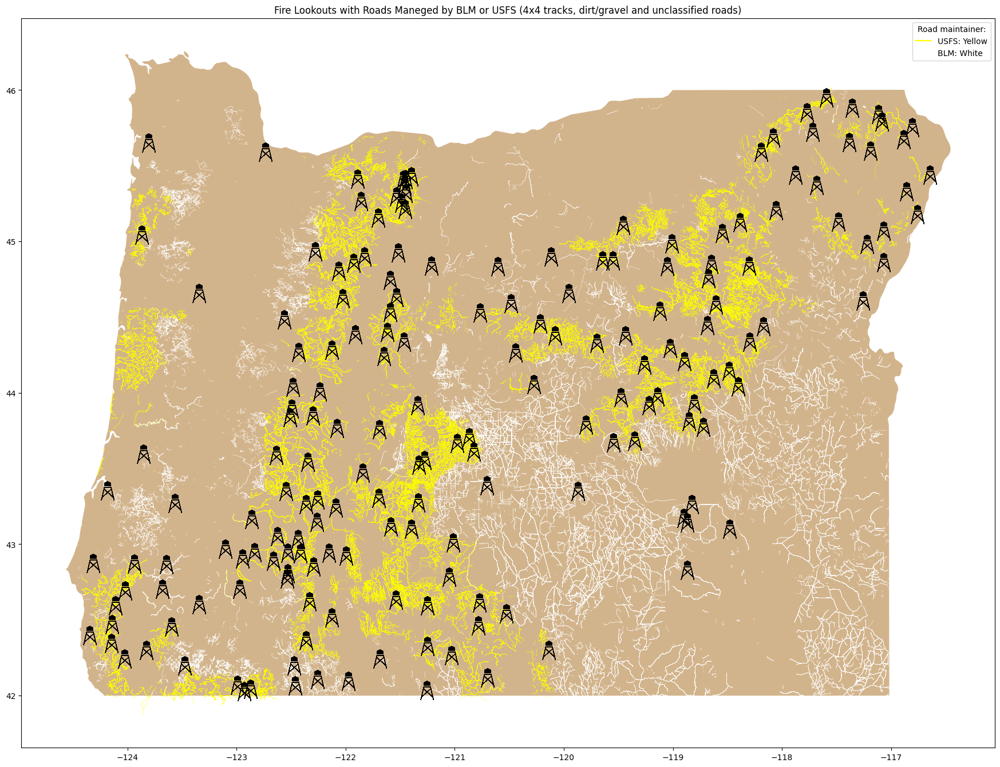

In [33]:
color_dict = {'USFS': 'yellow', 'BLM': 'white'}
tracks_public['color'] = tracks_public['PROPERTY_S'].map(color_dict)

ax = oregon.plot(figsize=(20, 20), color='tan')

tracks_public.plot(ax=ax, color=tracks_public['color'], linewidth=0.3)

for label, color in color_dict.items():
    ax.plot([], [], color=color, label=f'{label}: {color.capitalize()}')

plot_custom_marker(ax, fire_lookouts, tower_marker_path)
ax.legend(title="Road maintainer:")
ax.set_title('Fire Lookouts with Roads Maneged by BLM or USFS (4x4 tracks, dirt/gravel and unclassified roads)')
plt.tight_layout()
plt.savefig('towers_with_tracks.png', bbox_inches='tight')
plt.show()

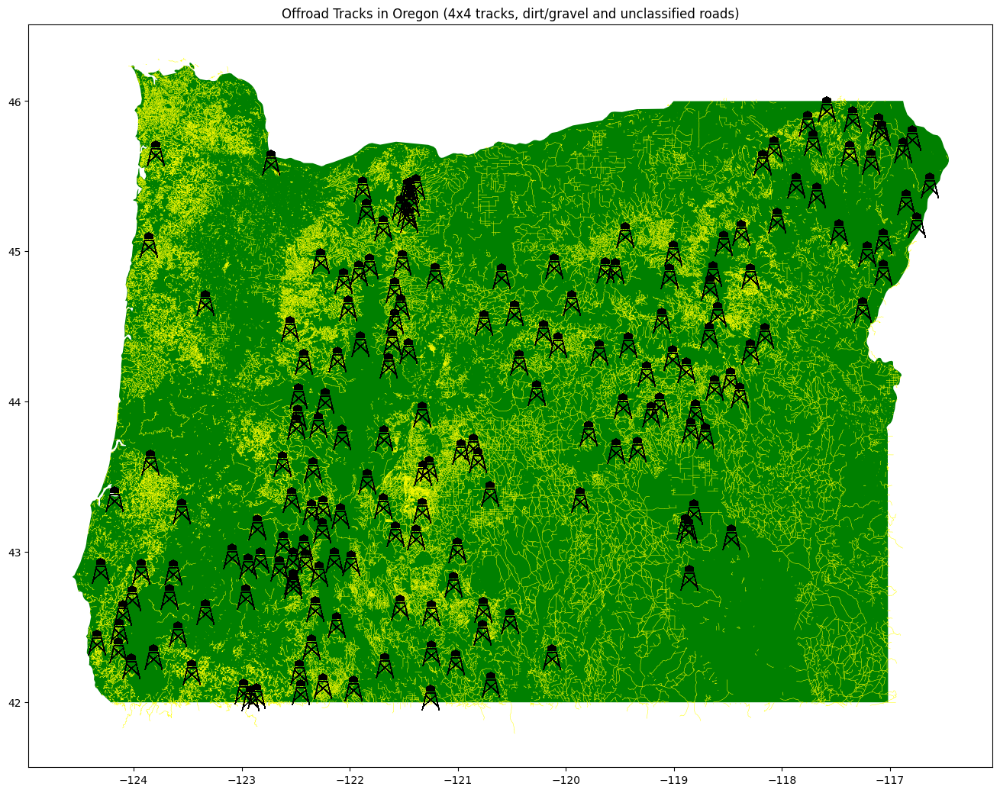

In [34]:
ax = oregon.plot(figsize=(15, 15), color = 'green')
tracks.plot(ax=ax, color='yellow', linewidth=0.35)
ax.set_title('Offroad Tracks in Oregon (4x4 tracks, dirt/gravel and unclassified roads)')
plot_custom_marker(ax, fire_lookouts, tower_marker_path)
plt.tight_layout()
plt.savefig('all_track_lookouts.png', bbox_inches='tight')
plt.show()


In [ ]:
tower_property = gpd.sjoin(fire_lookouts, land_use, predicate='intersects')

In [ ]:
tower_property

,X,Y,Name,description,geometry,index_right,PROPERTY_S,FEDERAL_ST,JURIS_NAME
0,-121.63547,44.39972,Black Butte,6436'<br>[http://www.firelookout.com/or/blackb...,POINT (-121.63547 44.39972),221846,USFS,PD,Deschutes NF
1,-121.47505,45.2114,Bus Point,3333'<br>[http://www.firelookout.com/or/buspoi...,POINT (-121.47505 45.21140),218526,USFS,PD,MT HOOD NF
2,-121.71856,45.15647,Clear Lake Butte,4458'<br>[http://www.firelookout.com/or/clearl...,POINT (-121.71856 45.15647),108797,USFS,PD,Mt Hood NF
3,-121.87568,45.26415,Devils Peak,5045'<br>[http://www.firelookout.com/or/devils...,POINT (-121.87568 45.26415),178434,USFS,UND,Mt Hood NF
4,-121.23481,44.83982,Eagle Butte,3175'<br>[http://www.firelookout.com/or/eagleb...,POINT (-121.23481 44.83982),110397,BIA,IAF,Warm Springs Reservation
...,...,...,...,...,...,...,...,...,...
178,-121.55381,44.62991,Alder Springs,4496'<br>[http://www.firelookout.com/or/alders...,POINT (-121.55381 44.62991),157688,USFS,UND,Deschutes NF
179,-122.96456,42.90341,Callahan Mtn.,2914'<br>[http://www.firelookout.com/or/callah...,POINT (-122.96456 42.90341),252608,USFS,PD,Umpqua NF
180,-122.31415,42.85178,Huckleberry (Shasta),6281'<br>[http://www.firelookout.com/or/huckle...,POINT (-122.31415 42.85178),163369,USFS,PD,Rogue River-Siskiyou NF
181,-121.29358,43.55536,Green Butte,5798'<br>[http://www.firelookout.com/or/greenb...,POINT (-121.29358 43.55536),116065,USFS,UND,Deschutes NF


In [ ]:
towers_public = tower_property[tower_property['PROPERTY_S'].isin(['USFS', 'BLM'])].reset_index(drop = True)
towers_public.head()

,X,Y,Name,description,geometry,index_right,PROPERTY_S,FEDERAL_ST,JURIS_NAME
0,-121.63547,44.39972,Black Butte,6436'<br>[http://www.firelookout.com/or/blackb...,POINT (-121.63547 44.39972),221846,USFS,PD,Deschutes NF
1,-121.47505,45.2114,Bus Point,3333'<br>[http://www.firelookout.com/or/buspoi...,POINT (-121.47505 45.21140),218526,USFS,PD,MT HOOD NF
2,-121.71856,45.15647,Clear Lake Butte,4458'<br>[http://www.firelookout.com/or/clearl...,POINT (-121.71856 45.15647),108797,USFS,PD,Mt Hood NF
3,-121.87568,45.26415,Devils Peak,5045'<br>[http://www.firelookout.com/or/devils...,POINT (-121.87568 45.26415),178434,USFS,UND,Mt Hood NF
4,-121.46869,45.41005,Fivemile Butte,4627'<br>[http://www.firelookout.com/or/fivemi...,POINT (-121.46869 45.41005),184548,USFS,UND,Mt Hood NF


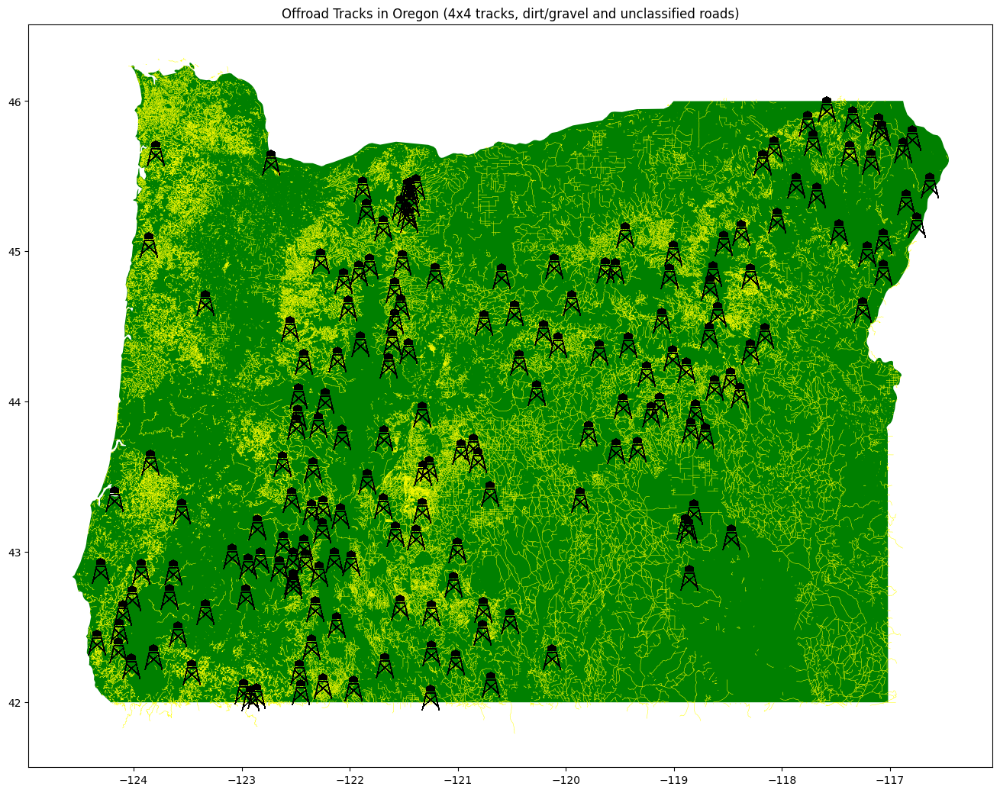

In [37]:
ax = oregon.plot(figsize=(15, 15), color = 'green')
tracks.plot(ax=ax, color='yellow', linewidth=0.35)
ax.set_title('Offroad Tracks in Oregon (4x4 tracks, dirt/gravel and unclassified roads)')
plot_custom_marker(ax, fire_lookouts, tower_marker_path)
plt.tight_layout()
plt.savefig('all_track_lookouts.png', bbox_inches='tight')
plt.show()

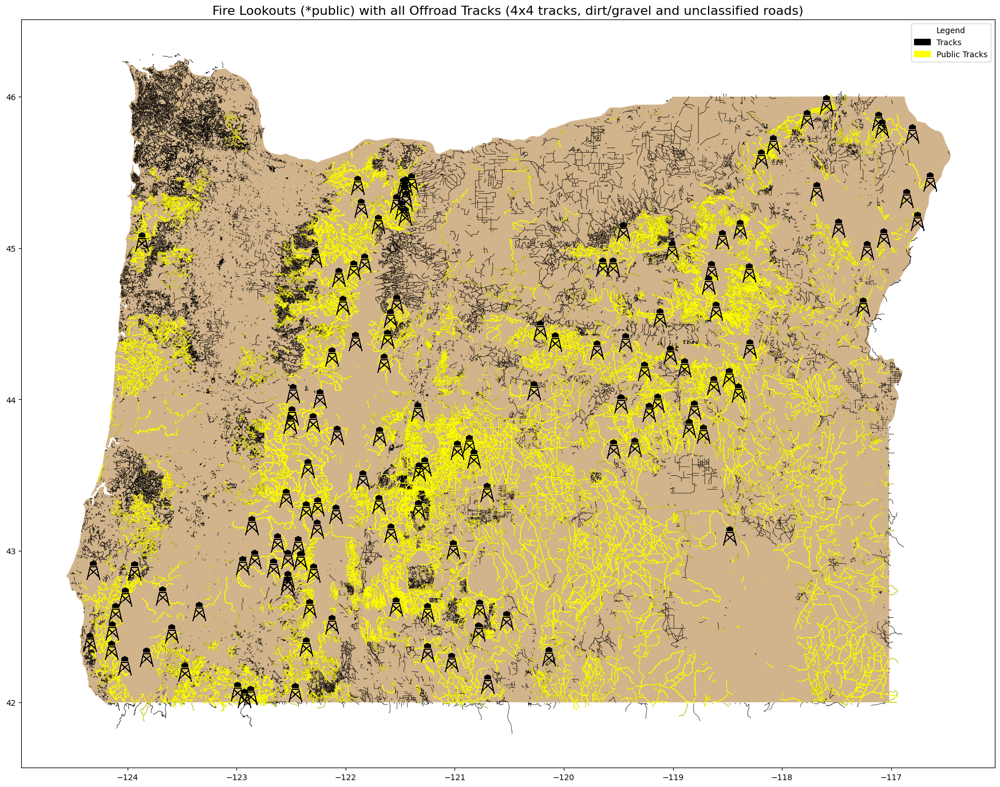

In [ ]:
#plotting lookouts on public lands

ax = oregon.plot(figsize=(20, 20), color='tan')

tracks.plot(ax=ax, color='black', linewidth=0.5, alpha = 1)
tracks_public.plot(ax=ax, color='yellow', linewidth=0.5, alpha = 1)


plot_custom_marker(ax, towers_public, tower_marker_path)

black_patch = mpatches.Patch(color='black', label='Tracks')
yellow_patch = mpatches.Patch(color='yellow', label='Public Tracks')
plt.legend(handles=[black_patch, yellow_patch], title="Legend", loc="upper right")

ax.set_title('Fire Lookouts (*public) with all Offroad Tracks (4x4 tracks, dirt/gravel and unclassified roads)', fontsize=16)

plt.tight_layout()
plt.savefig('towers_with_tracks_public.png', bbox_inches='tight')

plt.show()